In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

**Распределение цен на жилье**

In [3]:
df = pd.read_csv('AB_NYC_2019.csv')

df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

df_clean = df.dropna(subset=['price', 'reviews_per_month', 'last_review'])

Q1 = df_clean['price'].quantile(0.25)
Q3 = df_clean['price'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR
df_clean = df_clean[(df_clean['price'] >= lower) & (df_clean['price'] <= upper)]

reviews_by_month = df_clean.groupby(df_clean['last_review'].dt.to_period('M'))['number_of_reviews'].sum().reset_index()
reviews_by_month['last_review'] = reviews_by_month['last_review'].astype(str)

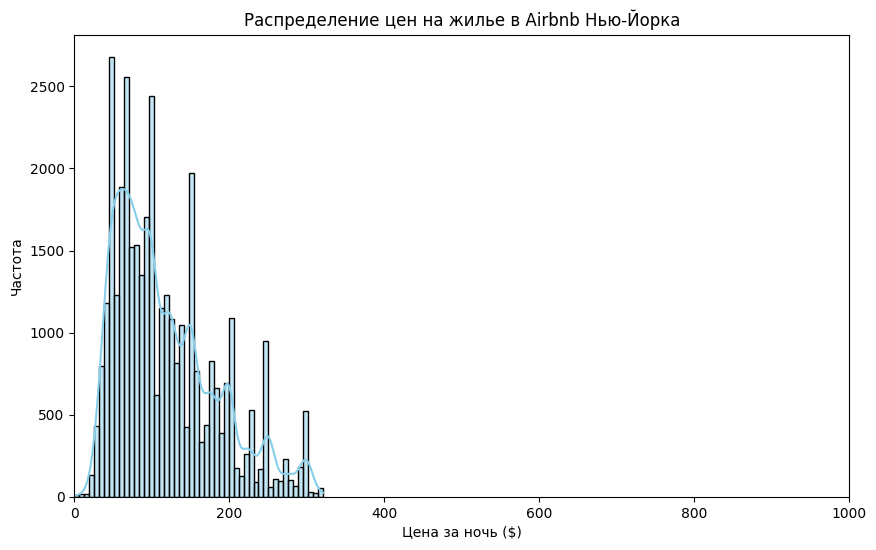

In [4]:
plt.figure(figsize=(10, 6))
sns.histplot(df_clean['price'], bins=50, kde=True, color='skyblue')
plt.title('Распределение цен на жилье в Airbnb Нью-Йорка')
plt.xlabel('Цена за ночь ($)')
plt.ylabel('Частота')
plt.xlim(0, 1000)
plt.show()

**Средняя (медианная (np.median)) цена по районам**

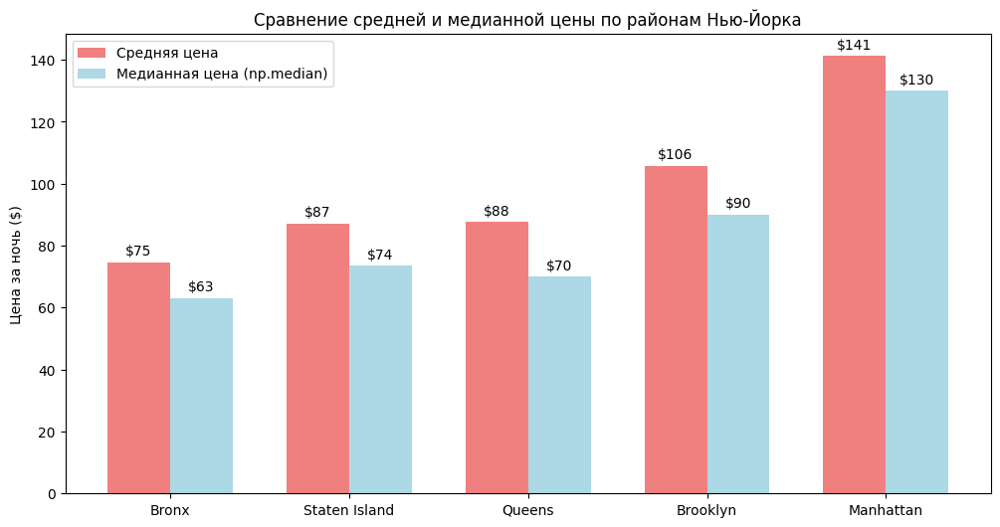

In [ ]:
сprice_stats = df_clean.groupby('neighbourhood_group')['price'].agg(
    mean='mean',
    median=lambda x: np.median(x)  
).sort_values('mean')

fig, ax = plt.subplots(figsize=(12, 6))
x = range(len(price_stats))
width = 0.35

bars1 = ax.bar([i - width/2 for i in x], price_stats['mean'], width, label='Средняя цена', color='lightcoral')
bars2 = ax.bar([i + width/2 for i in x], price_stats['median'], width, label='Медианная цена (np.median)', color='lightblue')

ax.bar_label(bars1, fmt='$%.0f', padding=3)
ax.bar_label(bars2, fmt='$%.0f', padding=3)

ax.set_xticks(x)
ax.set_xticklabels(price_stats.index)
ax.set_title('Сравнение средней и медианной цены по районам Нью-Йорка')
ax.set_ylabel('Цена за ночь ($)')
ax.legend()
plt.show()

**Зависимость цены от количества отзывов**

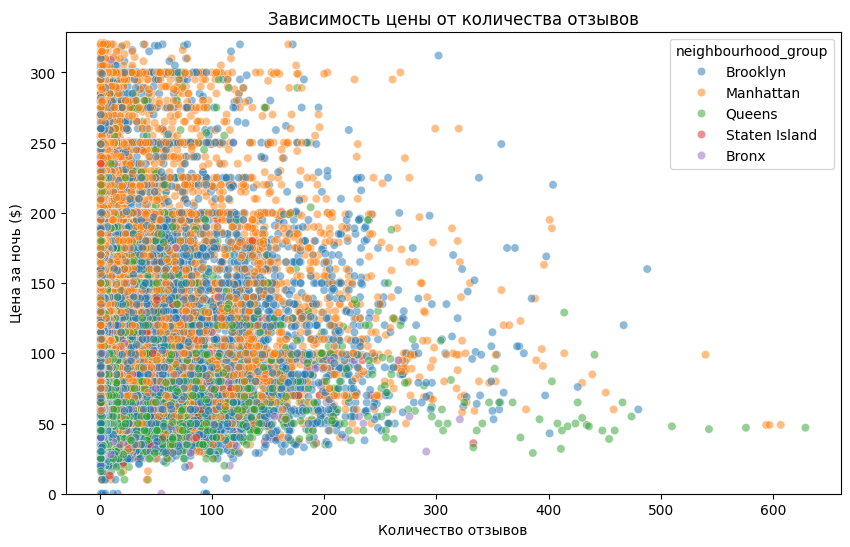

In [6]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_clean, x='number_of_reviews', y='price', alpha=0.5, hue='neighbourhood_group')
plt.title('Зависимость цены от количества отзывов')
plt.xlabel('Количество отзывов')
plt.ylabel('Цена за ночь ($)')
plt.ylim(0, 329)
plt.show()

**Тепловая карта (heatmap) корреляции числовых признаков**

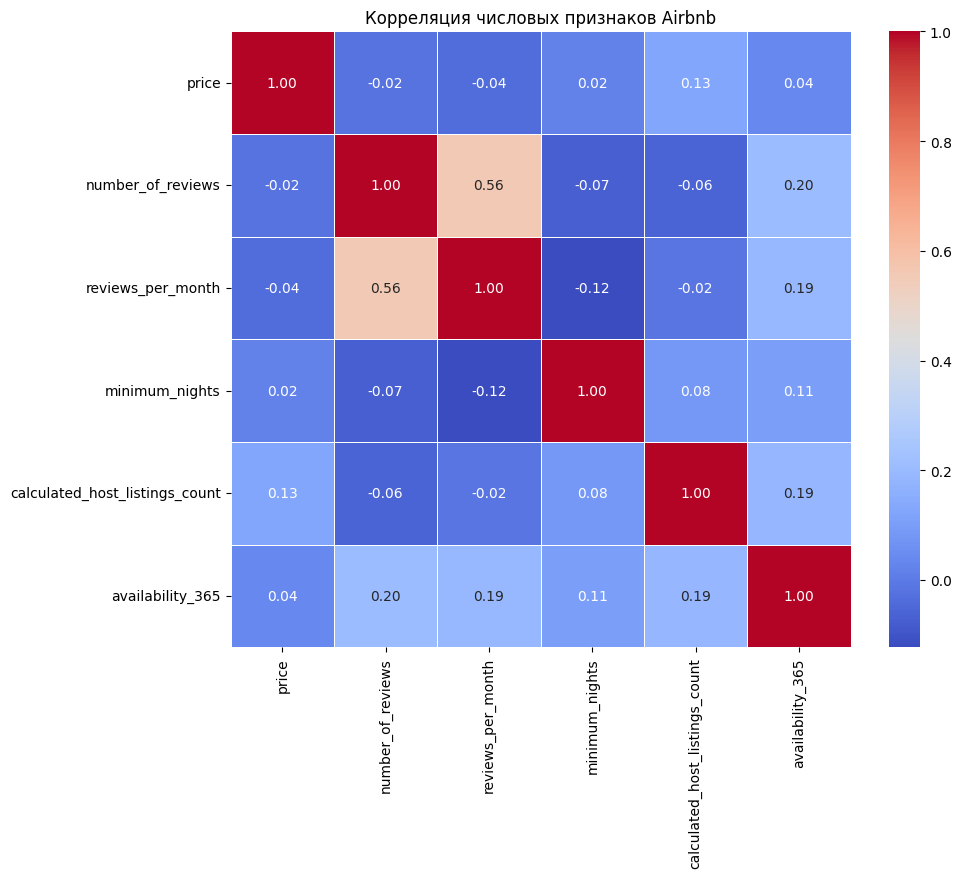

In [7]:
numeric_cols = ['price', 'number_of_reviews', 'reviews_per_month', 'minimum_nights', 'calculated_host_listings_count', 'availability_365']
corr = df_clean[numeric_cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Корреляция числовых признаков Airbnb')
plt.show()

**Карта цен по районам (интерактивная)**

In [8]:
fig_map = px.scatter_mapbox(
    df_clean,
    lat='latitude',
    lon='longitude',
    color='price',
    size='price',
    hover_data=['neighbourhood', 'room_type', 'name'],
    color_continuous_scale='Viridis',
    zoom=9,
    height=600,
    title='Карта цен на жилье Airbnb в Нью-Йорке'
)
fig_map.update_layout(mapbox_style='carto-positron')
fig_map.show()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_10740\1770343622.py:1: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig_map = px.scatter_mapbox(


**Топ‑10 самых дорогих вариантов по типам комнаты**

In [ ]:
top10 = df_clean.nlargest(10, 'price')

fig = px.bar(
    top10,
    x='room_type',
    y='price',
    color='room_type',
    text='price',
    title='Топ-10 самых дорогих вариантов по типам комнаты',
    labels={'room_type': 'Тип комнаты', 'price': 'Цена за ночь ($)'},
    hover_data=['name', 'neighbourhood'] 
)
fig.update_traces(texttemplate='$%{text}', textposition='outside')
fig.update_layout(showlegend=False) 
fig.show()

**Динамика отзывов по месяцам (линейный график)**

In [10]:
reviews_by_month = df_clean.groupby(df_clean['last_review'].dt.to_period('M'))['number_of_reviews'].sum().reset_index()
reviews_by_month['last_review'] = reviews_by_month['last_review'].astype(str)

fig_line = px.line(
    reviews_by_month,
    x='last_review',
    y='number_of_reviews',
    markers=True,
    title='Динамика количества отзывов по месяцам',
    labels={'last_review': 'Месяц', 'number_of_reviews': 'Количество отзывов'}
)
fig_line.show()

**Круговая диаграмма типов жилья**

In [11]:
room_counts = df_clean['room_type'].value_counts().reset_index()
room_counts.columns = ['Тип комнаты', 'Количество']

fig_pie = px.pie(
    room_counts,
    values='Количество',
    names='Тип комнаты',
    title='Распределение типов жилья Airbnb в Нью-Йорке',
    hole=0.2,  
    color_discrete_sequence=px.colors.sequential.RdBu
)
fig_pie.update_traces(textposition='inside', textinfo='percent+label')
fig_pie.show()

**Статический дашборд (4 графика в одном окне)**

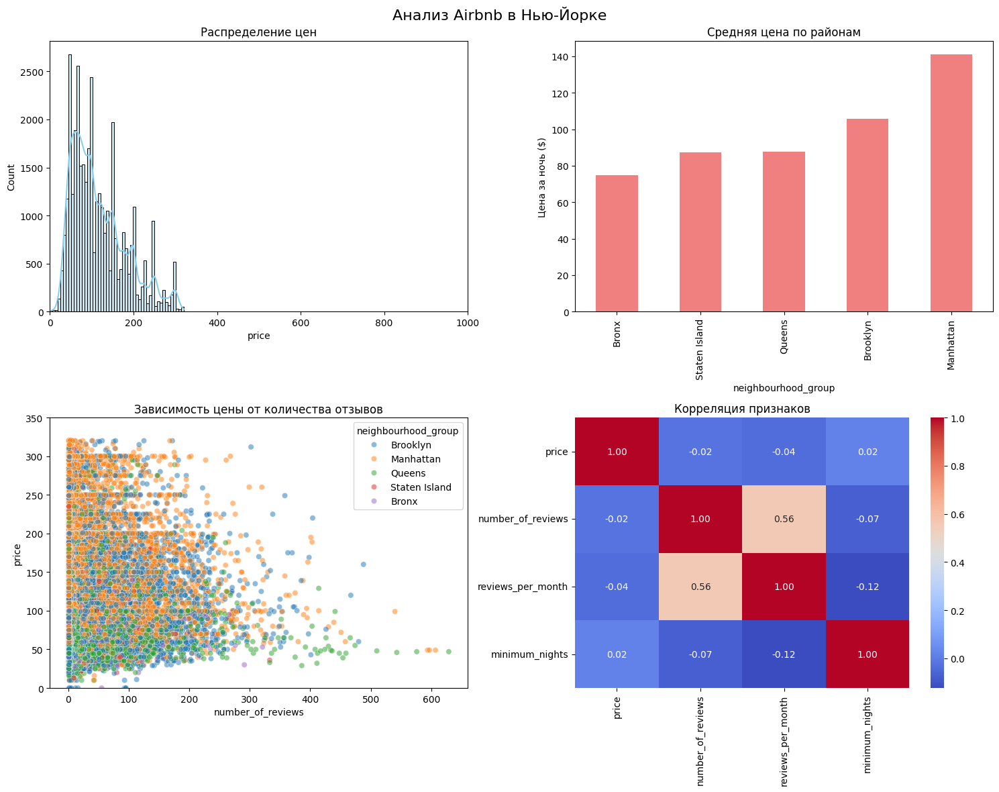

In [12]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Анализ Airbnb в Нью-Йорке', fontsize=16)

sns.histplot(df_clean['price'], bins=50, kde=True, color='skyblue', ax=axes[0,0])
axes[0,0].set_title('Распределение цен')
axes[0,0].set_xlim(0, 1000)

price_by_area = df_clean.groupby('neighbourhood_group')['price'].mean().sort_values()
price_by_area.plot(kind='bar', color='lightcoral', ax=axes[0,1])
axes[0,1].set_title('Средняя цена по районам')
axes[0,1].set_ylabel('Цена за ночь ($)')

sns.scatterplot(data=df_clean, x='number_of_reviews', y='price', alpha=0.5, hue='neighbourhood_group', ax=axes[1,0])
axes[1,0].set_title('Зависимость цены от количества отзывов')
axes[1,0].set_ylim(0, 350)

numeric_cols = ['price', 'number_of_reviews', 'reviews_per_month', 'minimum_nights']
sns.heatmap(df_clean[numeric_cols].corr(), annot=True, cmap='coolwarm', fmt='.2f', ax=axes[1,1])
axes[1,1].set_title('Корреляция признаков')

plt.tight_layout()
plt.savefig('static_dashboard.png', dpi=150)
plt.show()

**Интерактивный HTML‑дашборд для графиков**

**Ответы:**

**В каком районе Нью-Йорка самые высокие цены?**

In [13]:
price_by_area = df_clean.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=False)
print(price_by_area)

neighbourhood_group
Manhattan        141.253129
Brooklyn         105.812315
Queens            87.641970
Staten Island     87.163462
Bronx             74.664740
Name: price, dtype: float64


**Есть ли связь между количеством отзывов и ценой?**

In [14]:
corr = df_clean['number_of_reviews'].corr(df_clean['price'])
print(f"Коэффициент корреляции Пирсона: {corr:.3f}")

Коэффициент корреляции Пирсона: -0.019


*Слабая отрицательная связь. То есть дорогие объекты часто имеют немного меньше отзывов, но линейной зависимости нет*

**Какой тип жилья самый популярный?**

In [15]:
print(df_clean['room_type'].value_counts(normalize=True) * 100)

room_type
Entire home/apt    50.155035
Private room       47.568406
Shared room         2.276560
Name: proportion, dtype: float64


**Как добавлять подписи данных на графики?**

*В Matplotlib для столбчатых диаграмм удобно использовать ax.bar_label(). В Seaborn можно получить объект ax и применить bar_label к контейнерам.  
Для точечных графиков подписи ставятся вручную через ax.text() или с помощью plt.annotate(). В Plotly подписи включаются параметром text и texttemplate.*